# Label analysis for object detection


## Port asset detection

In this notebook, a template of data analysis is provided to visualise and augment data for better generalisation. However, the stage of processing is not limited to the ones listed here.


>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [3]:

training_file = '/mnt/ssd2/data/port/videos_2802/train.txt'

class_file = '/mnt/ssd2/data/port/videos_2802/port.names'

# Do the same for validation and testing files
#validation_file = '/mnt/ssd2/data/port/videos_2802/valid.txt'
#testing_file = '/mnt/ssd2/data/port/videos_2802/test.txt'

with open(class_file) as f:
    class_names = [line.rstrip('\n') for line in f.readlines()]
with open(training_file) as f:
    lines = [line.rstrip('\n') for line in f.readlines()]
    
#X_train, y_train = train['features'], train['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below. Use python, numpy and/or pandas methods to calculate the data summary rather than hard coding the results. For example, the [pandas shape method](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.shape.html) might be useful for calculating some of the summary results. 

### Provide a Basic Summary of the Data Set Using Python, Numpy and/or Pandas

In [37]:
import cv2
from tqdm.notebook import tqdm_notebook

n_train = len(lines)
n_classes = len(class_names)

label_stats = {}
for i in range(len(class_names)):
    label_stats[class_names[i]] = 0


image_size_stats = set()
for i in tqdm_notebook(range(len(lines))):
    line = lines[i]
    img = cv2.imread(line, cv2.IMREAD_UNCHANGED)
    image_size_stats.add(img.shape)
    line = line.replace('images','labels')
    line = line.replace('.jpg','.txt')
    line = line.replace('.png','.txt')
    f2 = open(line)
    for line in f2.readlines():
        class_id = int(line.rstrip('\n').split(' ')[0])
        label_stats[class_names[class_id]] += 1
print("stats: {}".format(label_stats))

print("Number of training examples =", len(lines))
print("Image data shape =", image_size_stats)
print("Number of classes =", n_classes)


stats: {'excavator': 6384, 'mini digger': 45, 'forklift': 1116, 'tractor': 2717, 'truck': 2483, 'crusher': 5133, 'articulated truck': 24968, 'cherry picker': 476, 'caravan': 1992, 'roller': 124, 'flatbed': 800, 'flatbed truck': 2714, 'cable reel': 1141, 'crane cabin': 0, 'lift arm': 54, 'machinery part': 8178, 'bus': 147, 'car': 3027, 'train': 375, 'materials': 4827, 'cement mixer': 1, 'harvester': 1, 'track dozer': 44, 'wheel dozer': 915, 'road paver': 0, 'crane': 2, 'container': 991, 'utility vehicle': 2}
Number of training examples = 1734
Image data shape = {(1072, 1920, 3), (1920, 2560, 3)}
Number of classes = 28


### Include an exploratory visualization of the dataset

Visualise the Port Dataset. The visualisation can include: plotting asset images, plotting the count of each asset, etc. 

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualisations in Python.

**NOTE:** It can be interesting to look at the distribution of classes in the training, validation(if any) and test set. An immediate action for biased dataset is to balance it.

In [39]:
### Prepare the images and labels

x_train_full_image = []
x_train = []
y_train = []
y_train_id = []
for i in tqdm_notebook(range(len(lines))):
    line = lines[i]
    img = cv2.imread(line, cv2.IMREAD_UNCHANGED)
    height = img.shape[0]
    width = img.shape[1]
    label_line = line.replace('images','labels')
    label_line = label_line.replace('.jpg','.txt')
    label_line = label_line.replace('.png','.txt')
    f2 = open(label_line)
    for line in f2.readlines():
        x_train_full_image.append(line)
        label = line.rstrip('\n').split(' ')
        class_id = int(label[0])
        x_centre = int(float(label[1]) * width)
        y_centre = int(float(label[2]) * height)
        half_bbox_width = int(float(label[3]) * width*0.5)
        half_bbox_height = int(float(label[4]) * height*0.5)
        crop_img = img[max(y_centre-half_bbox_height,0):min(y_centre+half_bbox_height,height), max(0,x_centre-half_bbox_width):min(width,x_centre+half_bbox_width)]
        if len(crop_img) == 0:
            print("Empty crop: {}, bbox: {}, {}, {}, {}".format(line, y_centre-half_bbox_height, y_centre+half_bbox_height, x_centre-half_bbox_width,x_centre+half_bbox_width))
        x_train.append(crop_img)
        y_train.append(class_names[class_id])
        y_train_id.append(class_id)

n_label = len(y_train)
print("There are {} labels".format(n_label))


There are 68657 labels


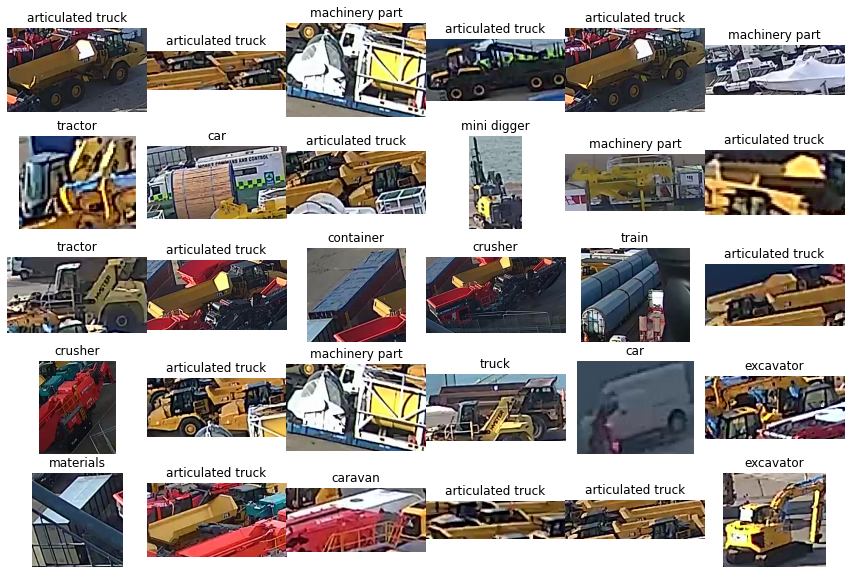

In [36]:
### Data exploration visualization code goes here.

import matplotlib.pyplot as plt
import random
# Visualizations will be shown in the notebook.
%matplotlib inline

# show image of random data points
sample_size = 30
fig, axs = plt.subplots(5, 6, figsize=(15, 10))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
for i in range(sample_size):
    index = random.randint(0, n_label)
    target = x_train[index]
    if len(crop_img) == 0:
        print("Empty image!")
    target_rgb = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)
    #target_rgb = target
    axs[i].axis('off')
    axs[i].imshow(target_rgb)
    axs[i].set_title(y_train[index])

#### Histogram of the traffic sign type distribution

##### Training set distribution

Minimum training sample number for one type: 0
Maximum training sample number for one type: 24968


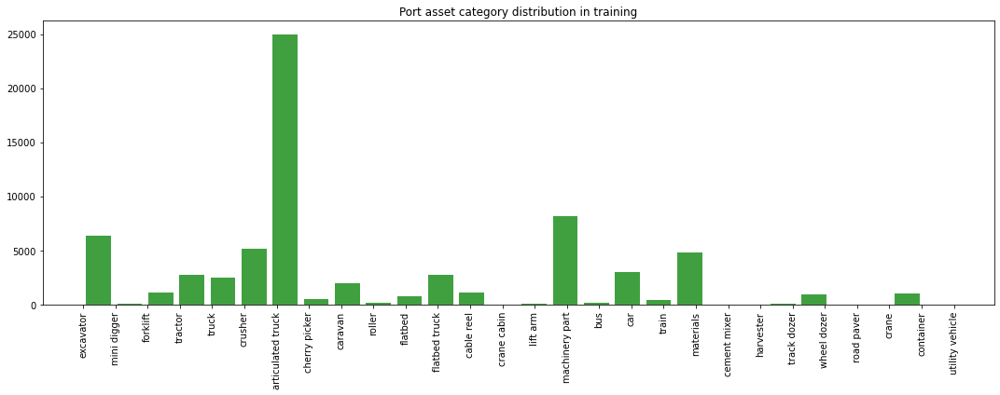

In [48]:
import numpy as np

print("Minimum training sample number for one type:", min(np.bincount(y_train_id)))
print("Maximum training sample number for one type:", max(np.bincount(y_train_id)))

fig, ax = plt.subplots(ncols=1, figsize=(15, 6))

ax.hist(y_train_id, n_classes, histtype='bar', facecolor='g', alpha=0.75, rwidth=0.8, align='left')
plt.subplots_adjust(bottom=0.25)
#ax.bar(label_stats.keys(), label_stats.values(), 1, color='g')
ax.set_xticks(range(len(label_stats.keys())))
ax.set_xticklabels(label_stats.keys(),rotation=90)
ax.set_title('Port asset category distribution in training')
fig.tight_layout()
plt.show()

##### Validation set distribution

In [49]:
### Do the same for validation

##### Test set distribution

In [50]:
### Do the same for testing

#### Dateset statistics in training set

In [57]:
id_to_name_dict = {}

for index in range(len(class_names)):
    id_to_name_dict[class_names[index]] = index

#print("{\n\t" + "\n\t".join("{}: {}".format(key, id_to_name_dict[key]) for key in sorted(id_to_name_dict.keys())) + "\n}")

id_to_name_dict = {k: v for k, v in sorted(id_to_name_dict.items(), key=lambda item: item[1])}
print("{\n\t" + "\n\t".join("{}: {}".format(key, id_to_name_dict[key]) for key in id_to_name_dict.keys()) + "\n}")


{
	excavator: 0
	mini digger: 1
	forklift: 2
	tractor: 3
	truck: 4
	crusher: 5
	articulated truck: 6
	cherry picker: 7
	caravan: 8
	roller: 9
	flatbed: 10
	flatbed truck: 11
	cable reel: 12
	crane cabin: 13
	lift arm: 14
	machinery part: 15
	bus: 16
	car: 17
	train: 18
	materials: 19
	cement mixer: 20
	harvester: 21
	track dozer: 22
	wheel dozer: 23
	road paver: 24
	crane: 25
	container: 26
	utility vehicle: 27
}


----

## Step 2: Data preprocessing and augmentation

Obviously, the labels for the port asset are biased(See the distribution above). There are various aspects to consider when thinking about this problem:

- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Augment the data.


### Pre-process the Data Set (normalization, grayscale, etc.)

First of all, the image data should be normalized so that the data has mean zero and equal variance. For image data, `(pixel - 128)/ 128` is a quick way to approximately normalize the data. When the color of the targets do not matter, we could turn the images into grayscale, too.

There are data augmentation techniques too: shifting, flipping, and rotation, etc.

In the case of port asset detection. We consider data augmentation.


#### Image augmentation

##### Random Translation by shifting images by random pixels

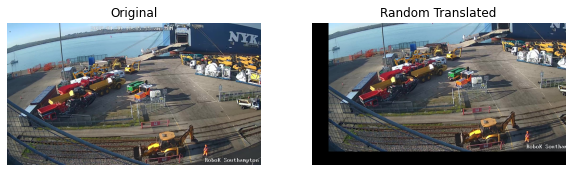

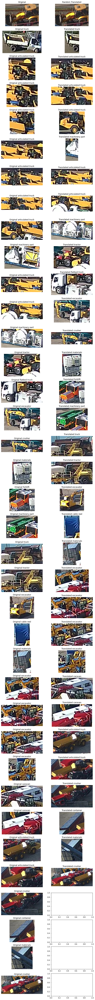

In [107]:
import cv2
import copy
import numpy as np

## Utility function for the RandomTranslate augmentation

def bbox_area(bbox):
    return (bbox[:,2] - bbox[:,0])*(bbox[:,3] - bbox[:,1])

def clip_box(bbox, clip_box, alpha):
    """Clip the bounding boxes to the borders of an image
    
    Parameters
    ----------
    
    bbox: numpy.ndarray
        Numpy array containing bounding boxes of shape `N X 4` where N is the 
        number of bounding boxes and the bounding boxes are represented in the
        format `x1 y1 x2 y2`
    
    clip_box: numpy.ndarray
        An array of shape (4,) specifying the diagonal co-ordinates of the image
        The coordinates are represented in the format `x1 y1 x2 y2`
        
    alpha: float
        If the fraction of a bounding box left in the image after being clipped is 
        less than `alpha` the bounding box is dropped. 
    
    Returns
    -------
    
    numpy.ndarray
        Numpy array containing **clipped** bounding boxes of shape `N X 4` where N is the 
        number of bounding boxes left are being clipped and the bounding boxes are represented in the
        format `x1 y1 x2 y2` 
    
    """
    ar_ = (bbox_area(bbox))
    x_min = np.maximum(bbox[:,0], clip_box[0]).reshape(-1,1)
    y_min = np.maximum(bbox[:,1], clip_box[1]).reshape(-1,1)
    x_max = np.minimum(bbox[:,2], clip_box[2]).reshape(-1,1)
    y_max = np.minimum(bbox[:,3], clip_box[3]).reshape(-1,1)
    
    bbox = np.hstack((x_min, y_min, x_max, y_max, bbox[:,4:]))
    
    delta_area = ((ar_ - bbox_area(bbox))/ar_)
    
    mask = (delta_area < (1 - alpha)).astype(int)
    
    bbox = bbox[mask == 1,:]


    return bbox

class RandomTranslate(object):
    """Randomly Translates the image    
    
    
    Bounding boxes which have an area of less than 25% in the remaining in the 
    transformed image is dropped. The resolution is maintained, and the remaining
    area if any is filled by black color.
    
    Parameters
    ----------
    translate: float or tuple(float)
        if **float**, the image is translated by a factor drawn 
        randomly from a range (1 - `translate` , 1 + `translate`). If **tuple**,
        `translate` is drawn randomly from values specified by the 
        tuple
        
    Returns
    -------
    
    numpy.ndaaray
        Translated image in the numpy format of shape `HxWxC`
    
    numpy.ndarray
        Tranformed bounding box co-ordinates of the format `n x 4` where n is 
        number of bounding boxes and 4 represents `x1,y1,x2,y2` of the box
        
    """

    def __init__(self, translate = 0.2, diff = False):
        self.translate = translate
        
        if type(self.translate) == tuple:
            assert len(self.translate) == 2, "Invalid range"  
            assert self.translate[0] > 0 & self.translate[0] < 1
            assert self.translate[1] > 0 & self.translate[1] < 1


        else:
            assert self.translate > 0 and self.translate < 1
            self.translate = (-self.translate, self.translate)
            
            
        self.diff = diff

    def __call__(self, img, bboxes):        
        if len(bboxes) == 0:
            print("No bounding boxes for random translate, direct return")
            return img, bboxes
        #Chose a random digit to scale by 
        img_shape = img.shape
        
        #translate the image
        
        #percentage of the dimension of the image to translate
        translate_factor_x = random.uniform(*self.translate)
        translate_factor_y = random.uniform(*self.translate)
        
        if not self.diff:
            translate_factor_y = translate_factor_x
            
        canvas = np.zeros(img_shape).astype(np.uint8)
    
        corner_x = int(translate_factor_x*img.shape[1])
        corner_y = int(translate_factor_y*img.shape[0])
  
        
        #change the origin to the top-left corner of the translated box
        orig_box_cords =  [max(0,corner_y), max(corner_x,0), min(img_shape[0], corner_y + img.shape[0]), min(img_shape[1],corner_x + img.shape[1])]
 
        mask = img[max(-corner_y, 0):min(img.shape[0], -corner_y + img_shape[0]), max(-corner_x, 0):min(img.shape[1], -corner_x + img_shape[1]),:]
        canvas[orig_box_cords[0]:orig_box_cords[2], orig_box_cords[1]:orig_box_cords[3],:] = mask
        img = canvas
        
        bboxes[:,:4] += [corner_x, corner_y, corner_x, corner_y]
        
        bboxes = clip_box(bboxes, [0,0,img_shape[1], img_shape[0]], 0.25)
        
        return img, bboxes

# Pick a random image for demenstration
random_index_for_translate_aug = random.randint(0, n_train)
test_image_path = lines[random_index_for_translate_aug]

img = cv2.imread(test_image_path, cv2.IMREAD_UNCHANGED)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
bboxes = []
height = img.shape[0]
width = img.shape[1]
label_line = test_image_path.replace('images','labels')
label_line = label_line.replace('.jpg','.txt')
label_line = label_line.replace('.png','.txt')
f2 = open(label_line)
skip = False
# TODO: define the unbalanced_classes later
unbalanced_classes = class_names
for line in f2.readlines():
    label = line.rstrip('\n').split(' ')
    class_id = int(label[0])
    if class_names[class_id] not in unbalanced_classes:
        skip = True
        break
    center_x_ratio = float(label[1])
    center_y_ratio = float(label[2])
    w_ratio = float(label[3])
    h_ratio = float(label[4])
    bboxes.append([width * max(0, center_x_ratio - 0.5*w_ratio),
                    height * max(0, center_y_ratio - 0.5*h_ratio),
                    width * min(width, center_x_ratio + 0.5*w_ratio),
                    height * min(height, center_y_ratio + 0.5*h_ratio),
                    class_id])
bboxes = np.array(bboxes)
bboxes = bboxes.astype(int)
original_bboxes = copy.deepcopy(bboxes)
#print("original_bboxes: {}".format(original_bboxes))
if not skip and len(bboxes) > 0:
    augmentation_num = 0
    # Do RandomTranslation
    img_aug = img.copy()
    translate = RandomTranslate(0.1, diff = True)
    img_aug, bboxes = translate(img_aug, bboxes)
    #print("len(bboxes): {}, len(original_bboxes): {}".format(len(bboxes), len(original_bboxes)))
    assert(img.shape[0] == img_aug.shape[0])
    assert(img.shape[1] == img_aug.shape[1])
    assert(img.shape[2] == img_aug.shape[2])


fig, axs = plt.subplots(1,2, figsize=(10, 3))
axs[0].axis('off')
axs[0].imshow(img.squeeze())
axs[0].set_title('Original')
axs[1].axis('off')
axs[1].imshow(img_aug.squeeze(), cmap='gray')
axs[1].set_title('Random Translated')
        
fig, axs = plt.subplots(len(original_bboxes),2, figsize=(10, 3*len(original_bboxes)))

for row in range(len(original_bboxes)):
    original_bbox = original_bboxes[row]
    original_crop = img[original_bbox[1]:original_bbox[3], original_bbox[0]:original_bbox[2]]
    axs[row, 0].axis('off')
    axs[row, 0].imshow(original_crop.squeeze())
    if row == 0:
        axs[row, 0].set_title('Original')
    else:
        axs[row, 0].set_title('Original ' + class_names[int(original_bbox[4])])

    if row >= len(bboxes):
        continue
    bbox = bboxes[row]
    crop = img_aug[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    axs[row, 1].axis('off')
    axs[row, 1].imshow(crop.squeeze(), cmap='gray')
    if row == 0:
        axs[row, 1].set_title('Random Translated')
    else:
        axs[row, 1].set_title('Translated ' + class_names[int(bbox[4])])



##### Random Sclaing by shifting images by random pixels

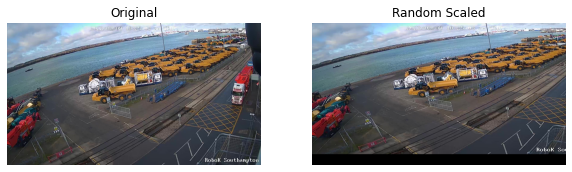

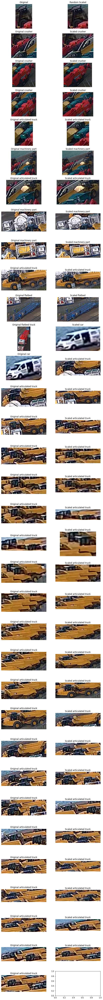

In [108]:
class RandomScale(object):

    def __init__(self, scale = 0.2, diff = False):
        self.scale = scale

        
        if type(self.scale) == tuple:
            assert len(self.scale) == 2, "Invalid range"
            assert self.scale[0] > -1, "Scale factor can't be less than -1"
            assert self.scale[1] > -1, "Scale factor can't be less than -1"
        else:
            assert self.scale > 0, "Please input a positive float"
            self.scale = (max(-1, -self.scale), self.scale)
        
        self.diff = diff

        

    def __call__(self, img, bboxes):
    
        if len(bboxes) == 0:
            print("No bounding boxes for random scalling, direct return")
            return img, bboxes
        #Chose a random digit to scale by 
        
        img_shape = img.shape
        
        if self.diff:
            scale_x = random.uniform(*self.scale)
            scale_y = random.uniform(*self.scale)
        else:
            scale_x = random.uniform(*self.scale)
            scale_y = scale_x
        
        resize_scale_x = 1 + scale_x
        resize_scale_y = 1 + scale_y
        
        img=  cv2.resize(img, None, fx = resize_scale_x, fy = resize_scale_y)
        
        bboxes[:,:4] *= [resize_scale_x, resize_scale_y, resize_scale_x, resize_scale_y]
        
        canvas = np.zeros(img_shape, dtype = np.uint8)
        
        y_lim = int(min(resize_scale_y,1)*img_shape[0])
        x_lim = int(min(resize_scale_x,1)*img_shape[1])
        
        canvas[:y_lim,:x_lim,:] =  img[:y_lim,:x_lim,:]
        
        img = canvas
        bboxes = clip_box(bboxes, [0,0,1 + img_shape[1], img_shape[0]], 0.25)
    
        return img, bboxes

# Pick a random image for demenstration
random_index_for_aug = random.randint(0, n_train)
test_image_path = lines[random_index_for_aug]

img = cv2.imread(test_image_path, cv2.IMREAD_UNCHANGED)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
bboxes = []
height = img.shape[0]
width = img.shape[1]
label_line = test_image_path.replace('images','labels')
label_line = label_line.replace('.jpg','.txt')
label_line = label_line.replace('.png','.txt')
f2 = open(label_line)
skip = False
# TODO: define the unbalanced_classes later
unbalanced_classes = class_names
for line in f2.readlines():
    label = line.rstrip('\n').split(' ')
    class_id = int(label[0])
    if class_names[class_id] not in unbalanced_classes:
        skip = True
        break
    center_x_ratio = float(label[1])
    center_y_ratio = float(label[2])
    w_ratio = float(label[3])
    h_ratio = float(label[4])
    bboxes.append([width * max(0, center_x_ratio - 0.5*w_ratio),
                    height * max(0, center_y_ratio - 0.5*h_ratio),
                    width * min(width, center_x_ratio + 0.5*w_ratio),
                    height * min(height, center_y_ratio + 0.5*h_ratio),
                    class_id])
bboxes = np.array(bboxes)
original_bboxes = copy.deepcopy(bboxes)
original_bboxes = original_bboxes.astype(int)
#print("original_bboxes: {}".format(original_bboxes))
if not skip and len(bboxes) > 0:
    augmentation_num = 0
    # Do RandomTranslation
    img_aug = img.copy()
    scale = RandomScale(0.2, diff = True)
    img_aug, bboxes = scale(img_aug, bboxes)
    #print("len(bboxes): {}, len(original_bboxes): {}".format(len(bboxes), len(original_bboxes)))
    assert(img.shape[0] == img_aug.shape[0])
    assert(img.shape[1] == img_aug.shape[1])
    assert(img.shape[2] == img_aug.shape[2])

bboxes = bboxes.astype(int)

fig, axs = plt.subplots(1,2, figsize=(10, 3))
axs[0].axis('off')
axs[0].imshow(img.squeeze())
axs[0].set_title('Original')
axs[1].axis('off')
axs[1].imshow(img_aug.squeeze(), cmap='gray')
axs[1].set_title('Random Scaled')
        
fig, axs = plt.subplots(len(original_bboxes),2, figsize=(10, 3*len(original_bboxes)))

for row in range(len(original_bboxes)):
    original_bbox = original_bboxes[row]
    original_crop = img[original_bbox[1]:original_bbox[3], original_bbox[0]:original_bbox[2]]
    axs[row, 0].axis('off')
    axs[row, 0].imshow(original_crop.squeeze())
    if row == 0:
        axs[row, 0].set_title('Original')
    else:
        axs[row, 0].set_title('Original ' + class_names[int(original_bbox[4])])

    if row >= len(bboxes):
        continue
    bbox = bboxes[row]
    crop = img_aug[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    axs[row, 1].axis('off')
    axs[row, 1].imshow(crop.squeeze(), cmap='gray')
    if row == 0:
        axs[row, 1].set_title('Random Scaled')
    else:
        axs[row, 1].set_title('Scaled ' + class_names[int(bbox[4])])

##### Randome warp

##### Random exposure

##### Four-way augmentation

##### Augmented distribution